# Evaluation metrics 
Authors: Björn (lutjens@mit.edu), Océane, Chris
(Source: https://docs.google.com/document/d/10tg_eAdMwtmPBzgQ8KgDCdxIAYJpzvw0kMNjzLRG0zY/edit)

Deliverable: **Get Evaluation metrics (lpips, IoU) for previously generated images**

1. Read from two folders (generated and ground truth) looking for images of the same name
2. Use these image pairs as inputs to a VGG (or lpips?) function and an IoU function
    - VGG can just be run directly on the images (https://github.com/S-aiueo32/lpips-pytorch),IS-Score, SSIM?
    - IoU requires segmentation model to be run
3. Print outputs from VGG and IoU to a .csv

# TO-TRYs
- Replace LPIPS on ImageNet with LPIPS on Satellite data (e.g., BigEarthNet, our own segmentation models, RESICS-45, etc.)


### Learnings -  pix2pixHD w/o phys.: human evaluation + LPIPS:
- Mainly keeps structure (i.e., doesn't flood buildings, or trees) and changes grassy green patches
- Paints an average "barfy-green" (30% flood, 70% non-flood) color on grassy areas
- Generated images (mainly structures) looks 'smeared' (e.g., hurricane-harvey_00000003)
- Gets change in color intensity (e.g., greener vegetation in harvey imagery)
- LPIPS(post, gen_wo_phys) is lower than LPIPS(post, pre) for pix2pixHD_baseline

### Learnings - pix2pixHD w. phys.: human evaluation + LPIPS:
- Model accurately visualizes flood extent. 
- We can clearly see how the conditioning on the segmentation was key to get a nearly perfect prediction of what should be flooded (e.g., hurricane-harvey_0000063, hurricane-harvey_00000068) - Chris
- We can see improving the segmentation network is still important (e.g., hurricane-florence_00000039, 00000116). Water segmentation models quite often picks up the clouds; now the image generator has learnt to put not only water when the mask is on, but sometimes clouds depending (possibibly depending on context and the disaster event) - Chris
- Also might be a good idea to make the masks binary before using them. I believe on some very bright part of the grayscale the segmentation network is hinting the clouds. So maybe can't even be seen well when plotting the mask, but the info is there - Chris
- matthew_00000042 is an odd one: It seems like the pre-image contains no information about on-ground structure but the generated post-flooding image displays the ground structure. What, i think, is happening is that the segmentation mask contains more information of the ground structure that we want. I think, we should binary threshold the segmentation mask before we feed it into pix2pixHD and see how that affects the test. - Björn
- LPIPS(post, gen_w_phys) is lower than LPIPS(post, gen_wo_phys)

### Learnings - pix2pixHD conditional_binary
- Thresholding segmentation masks to be binary has solved that 1) clouds are not reconstructed in generated imagery (florence), and 2) clouds in pre-flooding imagery cause uninformative output picture (matthew_0042)

# LPIPS
(Source: https://github.com/S-aiueo32/lpips-pytorch)

### Installation
- conda create --name evaluate3 python pip pillow ipykernel # pytorch torchvision cudatoolkit=10.2
- conda activate evaluate3
- pip install git+https://github.com/S-aiueo32/lpips-pytorch.git
- python -m pip install -U matplotlib

### Link conda env to jupyter notebook
- (in notebook cell) !conda init
- conda install -c anaconda ipykernel
- (in notebook cell) !source activate evaluate3; python -m ipykernel install --user --name evaluate3
- (refresh browser window)
- (opt1:) Open evaluate kernel in top-right corner of notebook

### Learnings (LPIPS):
- LPIPS score is [0,1] and perfect score is 0.
- LPIPS(post, post) achieves the perfect score 0


In [12]:
from evaluate import lpips

# SSIM
Source: https://scikit-image.org/docs/stable/api/skimage.metrics.html#skimage.metrics.structural_similarity

In [13]:
#TODO make work

import metrics from sklearn

ssim_post_pre = metrics.ssim(im_1, im_2)

SyntaxError: invalid syntax (<ipython-input-13-9af2f1282ec3>, line 3)

# IoU

In [14]:
from evaluate import IoU_metric

In [15]:
from evaluate import FVPS_Score1

# Read imagery (unit test)

In [5]:
model_e = "Pix2pixHD/conditional_binary"
model, experiment = model_e.split("/")
print(model, experiment)

Pix2pixHD conditional_binary


In [3]:
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as T
import os, glob
import numpy as np

from evaluate import get_im_paths
from utils import read_config_file

config = read_config_file(filename='config/houston_west.sh')

im_paths = get_im_paths(models_and_experiments=["Pix2pixHD/"+config['model_name'].replace('/','')], 
                 event=config['event'], im_suffix=config['im_suffix'], 
                 suffix_pre=config['suffix_pre'], suffix_post=config['suffix_post'], 
                 dataroot=config['dataroot'], new_paths=True, verbose=True)

# im_paths = get_im_paths(new_paths=True)# [0]
[print(im, ':\n\t', im_path) for im, im_path in zip(im_paths[0].keys(), im_paths[0].values())]

wildcard ../data/eie_floods/naip/houston_west/test_B/houston_west_*disaster.png
sorted im_ids [18, 26, 148, 162, 163, 164, 166, 169, 172, 175, 177, 182, 198, 199, 205, 229, 231, 246, 258, 263, 282, 285, 286, 288, 290, 291, 292, 296, 300, 302, 307, 337, 350, 362, 365, 371, 372, 389, 395, 427, 444, 460, 464, 466, 470, 473, 495, 509, 510, 511, 514, 552, 555, 556, 557, 564, 570, 572, 574, 578, 581, 619, 620, 622, 627, 628, 643, 648, 663, 679, 685, 686, 689, 692, 710, 711, 717, 718, 720, 723, 724, 725, 729, 736, 738, 757, 765, 772, 774, 783, 813, 818, 825, 826, 834, 839, 847, 865, 866, 871, 880, 883, 888, 889, 895, 909, 921, 944, 947, 950, 954, 956, 970, 992, 995, 999, 1013, 1025, 1031, 1044, 1061, 1085, 1087, 1094, 1097, 1100, 1104, 1106, 1111, 1115, 1128, 1129, 1143, 1147, 1151, 1166, 1172, 1177, 1182, 1209, 1212, 1218, 1224, 1238, 1239, 1241, 1248, 1250, 1255, 1281, 1289, 1298, 1351, 1355, 1356, 1358, 1376, 1381, 1382, 1399, 1420, 1421, 1432, 1436, 1440, 1449, 1451, 1452, 1456, 1457, 148

[None, None, None, None, None]

In [4]:
from evaluate import load_ims

In [7]:
from evaluate import get_binary_masks

im_path = get_im_paths(models_and_experiments=["Pix2pixHD/"+config['model_name'].replace('/','')], 
                 event=config['event'], im_suffix=config['im_suffix'], 
                 suffix_pre=config['suffix_pre'], suffix_post=config['suffix_post'], 
                 dataroot=config['dataroot'], new_paths=True, verbose=True)[0]

masks, masks_sloshed = get_binary_masks(im_path, ['post'], mask_shape=(1024,1024))

wildcard ../data/eie_floods/naip/houston_west/test_B/houston_west_*disaster.png
sorted im_ids [18, 26, 148, 162, 163, 164, 166, 169, 172, 175, 177, 182, 198, 199, 205, 229, 231, 246, 258, 263, 282, 285, 286, 288, 290, 291, 292, 296, 300, 302, 307, 337, 350, 362, 365, 371, 372, 389, 395, 427, 444, 460, 464, 466, 470, 473, 495, 509, 510, 511, 514, 552, 555, 556, 557, 564, 570, 572, 574, 578, 581, 619, 620, 622, 627, 628, 643, 648, 663, 679, 685, 686, 689, 692, 710, 711, 717, 718, 720, 723, 724, 725, 729, 736, 738, 757, 765, 772, 774, 783, 813, 818, 825, 826, 834, 839, 847, 865, 866, 871, 880, 883, 888, 889, 895, 909, 921, 944, 947, 950, 954, 956, 970, 992, 995, 999, 1013, 1025, 1031, 1044, 1061, 1085, 1087, 1094, 1097, 1100, 1104, 1106, 1111, 1115, 1128, 1129, 1143, 1147, 1151, 1166, 1172, 1177, 1182, 1209, 1212, 1218, 1224, 1238, 1239, 1241, 1248, 1250, 1255, 1281, 1289, 1298, 1351, 1355, 1356, 1358, 1376, 1381, 1382, 1399, 1420, 1421, 1432, 1436, 1440, 1449, 1451, 1452, 1456, 1457, 148

# Plot

In [8]:
import matplotlib.transforms as mtrans

from evaluate import Eval_plot

In [ ]:
## Rename BicycleGAN-HD images
rename -v -n 's/_synthesized.png/_synthesized_image.jpg/' test-*.png # Generated image
rename -v -n 's/_synthesized_fake_B.png/_synthesized_image_fake_B.png/' test-*.png # Mask of generated image
# rename -v -n 's/_random_synthesized_sample01_image_fake_B.png/_synthesized_image_fake_B.png/' test-*.png # Mask of generated image
rename -v -n 's/_random_synthesized_sample02_image_fake_B.png/_synthesized_image_fake_B.png/' test-*.png # Mask of generated image
rename -v -n 's/_P_post_mask.png/_input_label.jpg/' test-*.png # Input mask

# Generate baseline images by painting in brown

In [21]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import time 

from evaluate import get_im_id, get_im_paths
from evaluate import load_ims
from evaluate import get_binary_masks
from utils import read_config_file

from evaluate import gen_baseline_ims 

config = read_config_file(filename='config/houston_west.sh')
gen_baseline_ims(n_pics=20000, sloshed=False, plot=False, config=config)

houston_west_
wildcard ../data/eie_floods/naip/houston_west/test_B/houston_west_*disaster.png
0
20
40
60
80
100
120
140
160
180
200
220
240
260
280
300
320
340
360
380
400
420
440
460
480
500
520
540
560
580
600
620
640
660
680
700
720
740
760
780
800
820


# Plot a large grid of generated imagery

houston_west_
wildcard ../data/eie_floods/naip/houston_west/test_B/houston_west_*disaster.png
{'path_pre': '../data/eie_floods/naip/houston_west/test_A/houston_west_00000018_disaster.png', 'path_post': '../data/eie_floods/naip/houston_west/test_B/houston_west_00000018_disaster.png', 'mask_path_post': '../data/eie_floods/naip/houston_west/test_mask/houston_west_00000018_disaster.png', 'path_gen_Pix2pixHD/conditional_binary_houston_west_b1': '../results/Pix2pixHD/conditional_binary_houston_west_b1/test_B/houston_west_00000018_disaster.jpg', 'mask_path_gen_Pix2pixHD/conditional_binary_houston_west_b1': '../results/Pix2pixHD/conditional_binary_houston_west_b1/test_mask/houston_west_00000018_disaster.png'}


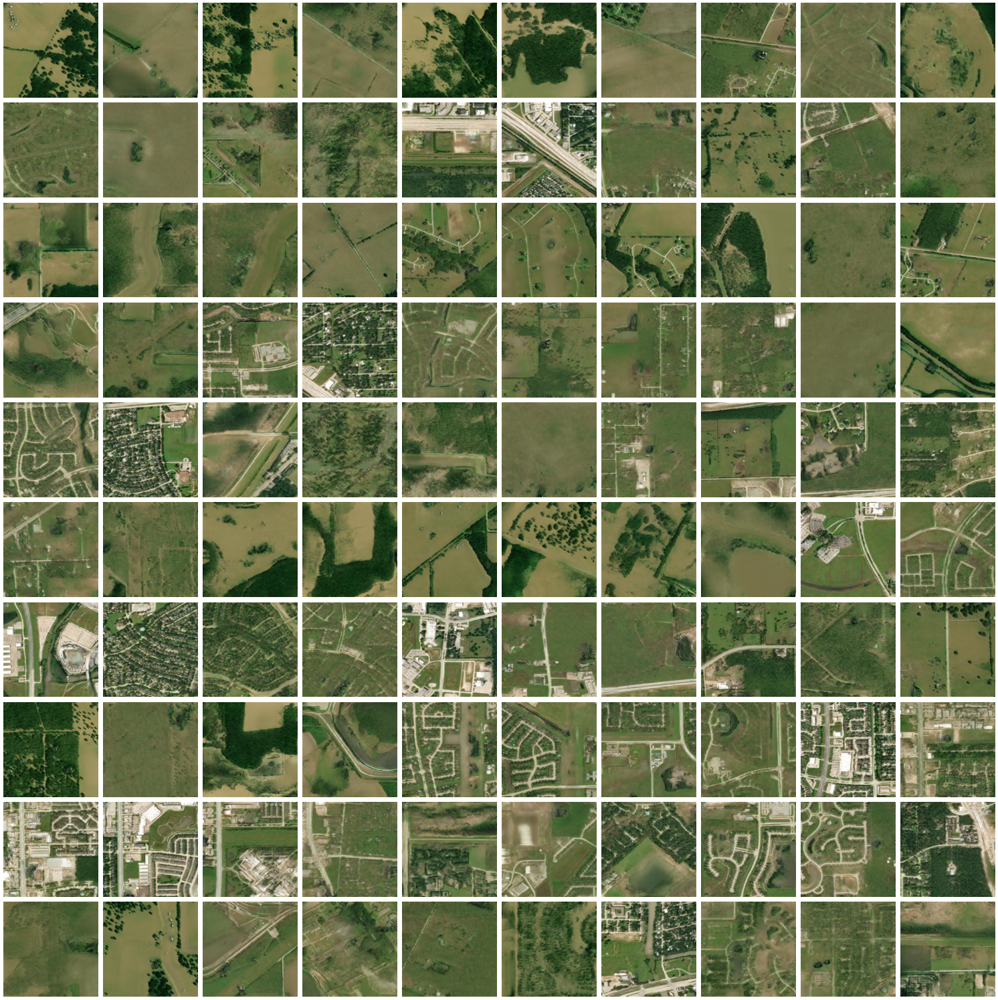

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
from evaluate import get_im_paths
from evaluate import load_ims
from utils import read_config_file

def plot_grid_of_gen_ims(n_rows=10,
        dpi=50,
        event='hurricane-florence_',
        model_and_experiment='Pix2pixHD/conditional_binary',
        fontsize=12,
        im_shape=(1024,1024),
        plt_dir='../figures/grid_of_gen_ims/',
        display=False,
        config=None,
    ):
    # Init plot
    fig, axs = plt.subplots(n_rows, n_rows, 
                        figsize = (3*n_rows, 3*n_rows), dpi=dpi)

    # Handle indexing for n_pics == 1
    if n_rows == 1: 
        axs = axs.reshape(1,1)
    
    # Get image paths
    n_pics = np.power(n_rows,2)
    # im_paths = get_im_paths(n_pics=n_pics, every=1, models_and_experiments=[model_and_experiment], event=event)
    im_paths = get_im_paths(n_pics=n_pics, every=1, 
                    models_and_experiments=[model_and_experiment], 
                     event=event, im_suffix=config['im_suffix'], 
                     suffix_pre=config['suffix_pre'], suffix_post=config['suffix_post'], 
                     dataroot=config['dataroot'], new_paths=True, verbose=False)
    print(im_paths[0])
    im_plt_titles = ['gen_' + model_and_experiment]

    # Plot images
    for i, im_path in enumerate(im_paths):
        ims_pil, _ = load_ims(im_path, im_plt_titles, im_shape=im_shape)
        row_id = np.floor_divide(i, n_rows)
        col_id = i%n_rows
        axs[row_id, col_id].imshow(ims_pil['gen_' + model_and_experiment])
    
    # Format and save plot
    [axi.set_axis_off() for axi in axs.ravel()]
    fig.tight_layout()
    if display:
        fig.show()
    fig.savefig(os.path.join(plt_dir, event + model_and_experiment.replace('/','_') + '_n_rows_' + str(n_rows) + '_dpi_' + str(dpi) + '.png'))

config = read_config_file(filename='config/houston_west.sh')
events = [config['event']] # ['hurricane-harvey_', 'hurricane-florence_']#, 'hurricane-michael_', 'hurricane-matthew_']
for event in events:
    print(event)
    plot_grid_of_gen_ims(event=event,
        model_and_experiment='Pix2pixHD/'+config['model_name'].replace('/',''),
        display=True, config=config)
    plt.plot()

In [ ]:
!ls ../figures/grid_of_gen_ims/

# Evaluate imagery

wildcard ../data/eie_floods/naip/houston_west/test_B/houston_west_*disaster.png
{'path_pre': '../data/eie_floods/naip/houston_west/test_A/houston_west_00000018_disaster.png', 'path_post': '../data/eie_floods/naip/houston_west/test_B/houston_west_00000018_disaster.png', 'mask_path_post': '../data/eie_floods/naip/houston_west/test_mask/houston_west_00000018_disaster.png', 'path_gen_flood_color/conditional_binary_houston_west': '../results/flood_color/conditional_binary_houston_west/test_B/houston_west_00000018_disaster.jpg', 'mask_path_gen_flood_color/conditional_binary_houston_west': '../results/flood_color/conditional_binary_houston_west/test_mask/houston_west_00000018_disaster.png', 'path_gen_Pix2pixHD/conditional_binary_houston_west': '../results/Pix2pixHD/conditional_binary_houston_west/test_B/houston_west_00000018_disaster.jpg', 'mask_path_gen_Pix2pixHD/conditional_binary_houston_west': '../results/Pix2pixHD/conditional_binary_houston_west/test_mask/houston_west_00000018_disaster.p

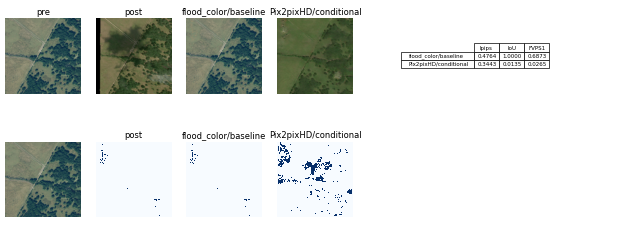

In [11]:
# ------------------------------
# Unit test for evaluate.eval_im
# ------------------------------
from evaluate import eval_im

from evaluate import get_im_paths
from evaluate import lpips
from evaluate import IoU_metric
from evaluate import FVPS_Score1
from evaluate import Eval_plot

n_pics = 1
im_plt_titles = ['pre', 'post', 
                 'gen_flood_color/'+config['model_name'].replace('/',''), 
                 'gen_Pix2pixHD/'+config['model_name'].replace('/','')]#'gen_flood_color/conditional_binary_sloshed', 'gen_Pix2pixHD/conditional_binary_sloshed']
models_and_experiments_abbr = ['flood_color/baseline', 'Pix2pixHD/conditional'] # 'flood_color/sloshed', 'Pix2pixHD/sloshed']
models_and_experiments = ['flood_color/'+config['model_name'].replace('/',''), 
            'Pix2pixHD/'+config['model_name'].replace('/','')]#'gen_flood_color/conditional_binary_sloshed', 'gen_Pix2pixHD/conditional_binary_sloshed']
            # "flood_color/conditional_binary_sloshed", "Pix2pixHD/conditional_binary_sloshed"]
im_paths = get_im_paths(n_pics=n_pics, every=1, 
                models_and_experiments=models_and_experiments,
                event=event, # event='hurricane-harvey_')
                im_suffix=config['im_suffix'], 
                suffix_pre=config['suffix_pre'], suffix_post=config['suffix_post'], 
                dataroot=config['dataroot'], new_paths=True, verbose=False)

eval_plot = Eval_plot(plt_seg_masks=True, n_pics=n_pics, im_plt_titles=im_plt_titles, models_and_experiments_abbr=models_and_experiments_abbr)

print(im_paths[0])#['path_flood_color/conditional_binary_houston_west'])
eval_metrics, eval_plot = eval_im(im_paths[0], im_plt_titles=im_plt_titles, im_shape=(1024,1024), 
        #experiments=["conditional_binary"],
        models_and_experiments=models_and_experiments,
        metrics=['lpips', 'IoU', 'FVPS1'],
        metric_fns=[lpips, IoU_metric, FVPS_Score1],
        eval_plot=eval_plot, plot=True)

for eval_metric in eval_metrics:
    print('%s: %.6f'% (eval_metric, float(eval_metrics[eval_metric])))

eval_plot.display_and_save(None)

## main: Evaluate imagery

wildcard ../data/eie_floods/naip/houston_west/test_B/houston_west_*disaster.png
Model + Experiments:  ['pre', 'post', 'gen_flood_color/conditional_binary_houston_west', 'gen_Pix2pixHD/conditional_binary_houston_west_b1', 'gen_Pix2pixHD/conditional_binary_houston_west15', 'gen_Pix2pixHD/conditional_binary_houston_west30', 'gen_Pix2pixHD/conditional_binary_houston_west150', 'gen_Pix2pixHD/conditional_binary_houston_west']
Metrics:  ['lpips', 'IoU', 'FVPS1']
Average evaluation for event,  houston_west_
lpips_post_gen_flood_color/conditional_binary_houston_west: 0.453
lpips_post_gen_Pix2pixHD/conditional_binary_houston_west_b1: 0.370
lpips_post_gen_Pix2pixHD/conditional_binary_houston_west15: 0.420
lpips_post_gen_Pix2pixHD/conditional_binary_houston_west30: 0.400
lpips_post_gen_Pix2pixHD/conditional_binary_houston_west150: 0.401
lpips_post_gen_Pix2pixHD/conditional_binary_houston_west: 0.404
IoU_post_gen_flood_color/conditional_binary_houston_west: 0.137
IoU_post_gen_Pix2pixHD/conditional_

OSError: [Errno 36] File name too long: '../figures/flood_color_conditional_binary_houston_west_Pix2pixHD_conditional_binary_houston_west_b1_Pix2pixHD_conditional_binary_houston_west15_Pix2pixHD_conditional_binary_houston_west30_Pix2pixHD_conditional_binary_houston_west150_Pix2pixHD_conditional_binary_houston_west_eval_w_wo_houston_west__start_0_n_30_dpi_50.png'

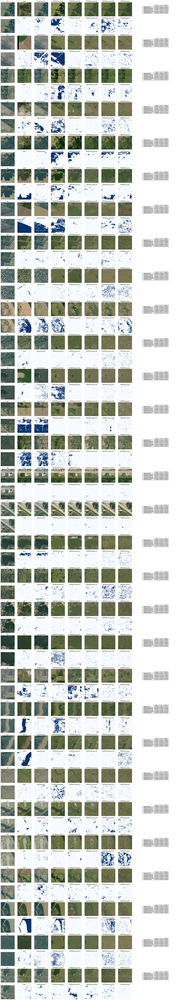

In [21]:
# ------------------------------
# Evaluate
# ------------------------------
import matplotlib.pyplot as plt
import numpy as np

from evaluate import eval_main
from evaluate import lpips
from evaluate import IoU_metric
from evaluate import FVPS_Score1
from utils import read_config_file

config = read_config_file('config/houston_west.sh')
for _ in [1]: # for starting_at in range(0,110,10):
    n_pics = 30 # 'all' #Number or 'all', works only if plotting is off
    start = 0 #starting_at
    every = 1 # 2 #if 'all' every must be 1
    dpi = 50 # 300
    plot = True # False

    # Define evaluation experiments
    events = [config['event']] # 'hurricane-harvey_', 'hurricane-michael_', 'hurricane-florence_', 'midwest-flooding_'] # , 
    # Uncomment for NeurIPS paper: models_and_experiments = ['flood_color/conditional_binary_segmented', 'flood_color/conditional_binary_sloshed_segmented','Pix2pixHD/baseline', 'Pix2pixHD/conditional_binary','Pix2pixHD/conditional_binary_sloshed', 'BicycleGAN-HD/trial_0_global_gen', 'BicycleGAN/conditional_binary','BicycleGAN/conditional_binary_sloshed']#,'BicycleGAN/conditional_binary_sloshed']
    # models_and_experiments = ['Pix2pixHD/conditional_binary', 'Pix2pixHD/conditional_binary_scratch_naip', 'Pix2pixHD/conditional_binary_scratch_naip_matched', 'Pix2pixHD/conditional_binary_scratch_naip_matched_flood', 'Pix2pixHD/conditional_binary_scratch_naip_match2']
    # models_and_experiments = ['Pix2pixHD/conditional_binary', 'Pix2pixHD/conditional_binary_scratch_naip', 'Pix2pixHD/conditional_binary_scratch_naip_match2', 'Pix2pixHD/conditional_binary_scratch_naip_match2_michael']
    models_and_experiments = ['flood_color/'+config['model_name'].replace('/',''), 
        'Pix2pixHD/'+config['model_name'].replace('/','')+'_b1',
        'Pix2pixHD/'+config['model_name'].replace('/','')+'15',
        'Pix2pixHD/'+config['model_name'].replace('/','')+'30',
        'Pix2pixHD/'+config['model_name'].replace('/','')+'150',
        'Pix2pixHD/'+config['model_name'].replace('/','')]
    # Uncomment for NeurIPS paper: models_and_experiments_abbr = ['baseline/bin', 'baseline/sloshed','P2PHD/baseline', 'P2PHD/bin','P2PHD/sloshed', 'BGAN/bin_trial','BGAN/bin','BGAN/sloshed'] #'baseline/bin', 'baseline/sloshed',, 
    #models_and_experiments_abbr = ['P2PHD/xbd', 'P2PHD/naip', 'P2PHD/match', 'P2PHD/m_flood']
    #models_and_experiments_abbr = ['P2PHD/xbd', 'P2PHD/naip', 'P2PHD/match', 'P2PHD/match_michael']
    models_and_experiments_abbr = ['base/houston', 
                                'P2PHD/houstonb1','P2PHD/houston15',
                                'P2PHD/houston30', 'P2PHD/houston150',
                                'P2PHD/houston']
    metrics = ['lpips', 'IoU', 'FVPS1']
    metric_fns = [lpips, IoU_metric, FVPS_Score1]

    evals = eval_main(events=events, models_and_experiments=models_and_experiments, 
              models_and_experiments_abbr=models_and_experiments_abbr, 
              n_pics=n_pics, start=start, metrics=metrics, metric_fns=metric_fns, 
              plot=plot, plt_seg_masks=True, plt_mask_w_background=False, dpi=dpi, every=every, do_display=False,
              new_paths=True, 
              config=config) # =None

    plt.plot()

In [3]:
print(len(evals), evals[0].keys())

10 dict_keys(['lpips_post_gen_flood_color/conditional_binary_segmented', 'lpips_post_gen_flood_color/conditional_binary_sloshed_segmented', 'lpips_post_gen_Pix2pixHD/baseline', 'lpips_post_gen_Pix2pixHD/conditional_binary', 'lpips_post_gen_Pix2pixHD/conditional_binary_sloshed', 'IoU_post_gen_flood_color/conditional_binary_segmented', 'IoU_post_gen_flood_color/conditional_binary_sloshed_segmented', 'IoU_post_gen_Pix2pixHD/baseline', 'IoU_post_gen_Pix2pixHD/conditional_binary', 'IoU_post_gen_Pix2pixHD/conditional_binary_sloshed', 'FVPS1_post_gen_flood_color/conditional_binary_segmented', 'FVPS1_post_gen_flood_color/conditional_binary_sloshed_segmented', 'FVPS1_post_gen_Pix2pixHD/baseline', 'FVPS1_post_gen_Pix2pixHD/conditional_binary', 'FVPS1_post_gen_Pix2pixHD/conditional_binary_sloshed'])


# Archive; don't read from here